# Рубежный контроль №1
| Группа   | ФИО           |   Номер в списке | Задание 1                                                                                                                                                  | Задание 2                                                                       | Задание 3                                                                             |
|----------|---------------|------------------|------------------------------------------------------------------------------------------------------------------------------------------------------------|---------------------------------------------------------------------------------|---------------------------------------------------------------------------------------|
| ИУ5-24М  | Леонид Перлин |                9 | Для набора данных проведите устранение пропусков для одного (произвольного) числового признака с использованием метода заполнения "хвостом распределения". | Для набора данных проведите удаление константных и псевдоконстантных признаков. | Для произвольной колонки данных построить график "Скрипичная диаграмма (violin plot)" |

## §0. Настройка

In [78]:
pip install plotly tabulate tqdm numpy pandas matplotlib

Note: you may need to restart the kernel to use updated packages.


In [79]:
from tabulate import tabulate
import pandas as pd
import numpy as np
from tqdm import tqdm
import plotly.express as px
from sklearn.impute import MissingIndicator, SimpleImputer
import seaborn as sns
import os
import plotly.io as pio
pio.renderers.default = 'notebook' 

%matplotlib inline


Папка для графиков 

In [80]:
if not os.path.exists("images"):
    os.mkdir("images")

## §1. Задание, вариант и набор данных

In [81]:
in_group_list_num = 9
group_name = 'ИУ5-24М'
name = 'Леонид Перлин'
task_1_num = 9
task_2_num = 29

task_1_text = '''
Для набора данных проведите устранение пропусков для одного (произвольного) числового признака с использованием метода заполнения "хвостом распределения".
'''

task_2_text = '''
Для набора данных проведите удаление константных и псевдоконстантных признаков.
'''

task_3_text = '''
Для произвольной колонки данных построить график "Скрипичная диаграмма (violin plot)"
'''

print(tabulate([[group_name, name,in_group_list_num,task_1_text,task_2_text,task_3_text]], headers=['Группа','ФИО','Номер в списке','Задание 1','Задание 2','Задание 3'],tablefmt='github'))

| Группа   | ФИО           |   Номер в списке | Задание 1                                                                                                                                                  | Задание 2                                                                       | Задание 3                                                                             |
|----------|---------------|------------------|------------------------------------------------------------------------------------------------------------------------------------------------------------|---------------------------------------------------------------------------------|---------------------------------------------------------------------------------------|
| ИУ5-24М  | Леонид Перлин |                9 | Для набора данных проведите устранение пропусков для одного (произвольного) числового признака с использованием метода заполнения "хвостом распределения". | Для набора данных проведите удаление констант

#### Первый датасет (Задание №3)

[![Kaggle link](https://img.shields.io/badge/Spotify%20топ%20чарты%20в%20мире%20%20-из%20Kaggle-blue?&logo=kaggle)](https://www.kaggle.com/datasets/dhruvildave/spotify-charts)

#### Второй датасет (Задания №1 и №2)

```df_bike``` взят из приложения "Здоровье" с моего телефона и представляет собой набор данных с велопоездки

In [82]:
df_bike = pd.read_csv('./data/route_2023-03-03_4.16pm/track_points.csv')
df_bike.head()

,X,Y,track_fid,track_seg_id,track_seg_point_id,ele,time,magvar,geoidheight,name,...,sat,hdop,vdop,pdop,ageofdgpsdata,dgpsid,speed,course,hAcc,vAcc
0,37.685089,55.765370,0,0,0,146.670151,2023/03/03 12:57:19+00,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.249437,103.951214,3.127947,1.486942
1,37.685092,55.765369,0,0,1,146.682946,2023/03/03 12:57:20+00,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.250490,104.202294,2.505558,1.338834
2,37.685095,55.765369,0,0,2,146.693712,2023/03/03 12:57:21+00,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.229481,104.679850,2.151725,1.187345
3,37.685099,55.765368,0,0,3,146.700226,2023/03/03 12:57:22+00,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.197788,104.288179,2.064231,1.071508
4,37.685102,55.765368,0,0,4,146.705792,2023/03/03 12:57:23+00,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.164360,101.709054,2.052416,0.985664


In [83]:
df = pd.read_csv('data/charts.csv')
df.head()

,title,rank,date,artist,url,region,chart,trend,streams
0,Chantaje (feat. Maluma),1,2017-01-01,Shakira,https://open.spotify.com/track/6mICuAdrwEjh6Y6...,Argentina,top200,SAME_POSITION,253019.0
1,Vente Pa' Ca (feat. Maluma),2,2017-01-01,Ricky Martin,https://open.spotify.com/track/7DM4BPaS7uofFul...,Argentina,top200,MOVE_UP,223988.0
2,Reggaetón Lento (Bailemos),3,2017-01-01,CNCO,https://open.spotify.com/track/3AEZUABDXNtecAO...,Argentina,top200,MOVE_DOWN,210943.0
3,Safari,4,2017-01-01,"J Balvin, Pharrell Williams, BIA, Sky",https://open.spotify.com/track/6rQSrBHf7HlZjtc...,Argentina,top200,SAME_POSITION,173865.0
4,Shaky Shaky,5,2017-01-01,Daddy Yankee,https://open.spotify.com/track/58IL315gMSTD37D...,Argentina,top200,MOVE_UP,153956.0


In [84]:
df.shape

(26173514, 9)

### Количество пропусков

In [85]:
def analyze(df=df):
    table_headers = ['Название столбца','Процент пропусков','Кол-во ункиальных значений']
    table = np.empty([3,len(df.columns)],dtype=np.dtype(object))
    table[0]= [col for col in tqdm(df.columns)]
    table[1]=[df[col].isna().sum()/df[col].notna().sum() for col in tqdm(df.columns)]
    table[2]=[df[col].nunique() for col in tqdm(df.columns)]
    table = table.transpose()
    print(tabulate(table,tablefmt='github',headers=table_headers))
    df_stats = pd.DataFrame(table,columns=table_headers)
    # df_stats
    fig = px.bar(df_stats, x="Название столбца", y='Процент пропусков',title="Процент пропусков в датасете")
    fig.show()

In [86]:
analyze()

100%|██████████| 9/9 [00:11<00:00,  1.24s/it]

| Название столбца   |   Процент пропусков |   Кол-во ункиальных значений |
|--------------------|---------------------|------------------------------|
| title              |         4.20272e-07 |                       164806 |
| rank               |         0           |                          200 |
| date               |         0           |                         1826 |
| artist             |         6.87719e-07 |                        96156 |
| url                |         0           |                       217704 |
| region             |         0           |                           70 |
| chart              |         0           |                            2 |
| trend              |         0           |                            4 |
| streams            |         0.287946    |                       788013 |


Датасет содержит пропуски в большом количестве строк в колонке `[streams]` - количество прослушиваний песни

## §2. Устранение пропусков для числового признака (хвост распределения)

In [87]:
analyze(df_bike)

  0%|          | 0/32 [00:00<?, ?it/s]/var/folders/g8/xtt465_57r53fy239yttrrrm0000gn/T/ipykernel_14914/4023454359.py:5: RuntimeWarning:

divide by zero encountered in long_scalars

100%|██████████| 32/32 [00:00<00:00, 6214.93it/s]


| Название столбца   |   Процент пропусков |   Кол-во ункиальных значений |
|--------------------|---------------------|------------------------------|
| X                  |           0         |                          396 |
| Y                  |           0         |                          105 |
| track_fid          |           0         |                            1 |
| track_seg_id       |           0         |                            1 |
| track_seg_point_id |           0         |                         1098 |
| ele                |           0         |                         1098 |
| time               |           0         |                         1089 |
| magvar             |         inf         |                            0 |
| geoidheight        |         inf         |                            0 |
| name               |         inf         |                            0 |
| cmt                |         inf         |                            0 |
| desc      

В колонке speed пропущено 4% значений

In [88]:
fig = px.scatter(df_bike, y='speed')
fig.show()

Пропуск данных в промежутке от 700 до 750 строчки

In [89]:
fig = px.histogram(df_bike,x='speed')
fig.show()

In [90]:
def research_impute_numeric_column(dataset, num_column, const_value=None):
    strategy_params = ['mean', 'median', 'most_frequent', 'constant']
    strategy_params_names = ['Среднее', 'Медиана', 'Мода']
    strategy_params_names.append('Константа = ' + str(const_value))
    
    original_temp_data = dataset[[num_column]].values
    size = original_temp_data.shape[0]
    original_data = original_temp_data.reshape((size,))
    
    new_df = pd.DataFrame({'Исходные данные':original_data})
       
    for i in range(len(strategy_params)):
        strategy = strategy_params[i]
        col_name = strategy_params_names[i]
        if (strategy!='constant') or (strategy == 'constant' and const_value!=None):
            if strategy == 'constant':
                temp_data, _, _ = impute_column(dataset, num_column, strategy, fill_value_param=const_value)
            else:
                temp_data, _, _ = impute_column(dataset, num_column, strategy)
            new_df[col_name] = temp_data
        
    sns.kdeplot(data=new_df)

def impute_column(dataset, column, strategy_param, fill_value_param=None):
    """
    Заполнение пропусков в одном признаке
    """
    temp_data = dataset[[column]].values
    size = temp_data.shape[0]
    
    indicator = MissingIndicator()
    mask_missing_values_only = indicator.fit_transform(temp_data)
    
    imputer = SimpleImputer(strategy=strategy_param, 
                            fill_value=fill_value_param)
    all_data = imputer.fit_transform(temp_data)
    
    missed_data = temp_data[mask_missing_values_only]
    filled_data = all_data[mask_missing_values_only]
    
    return all_data.reshape((size,)), filled_data, missed_data

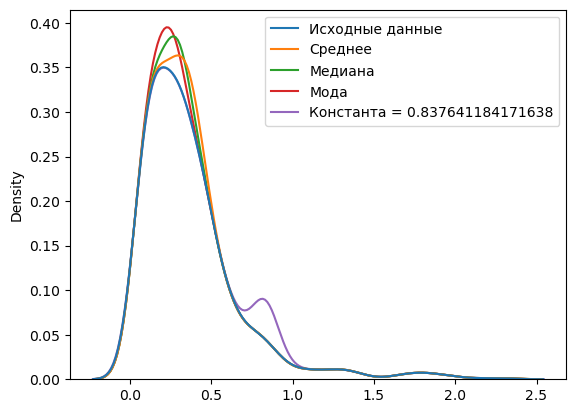

In [91]:
k_param = 1.5
bikeiqr = df_bike['speed'].mean() + k_param*df_bike['speed'].std()
bikeiqr

research_impute_numeric_column(df_bike, 'speed',bikeiqr)

In [92]:
IQR = df_bike['speed'].quantile(0.75) - df_bike['speed'].quantile(0.25)
speed_ev1 = df_bike['speed'].quantile(0.75) + k_param*IQR
print('IQR={}, extreme_value={}'.format(IQR, speed_ev1))
    

IQR=0.30194275000000004, extreme_value=0.9147161250000001


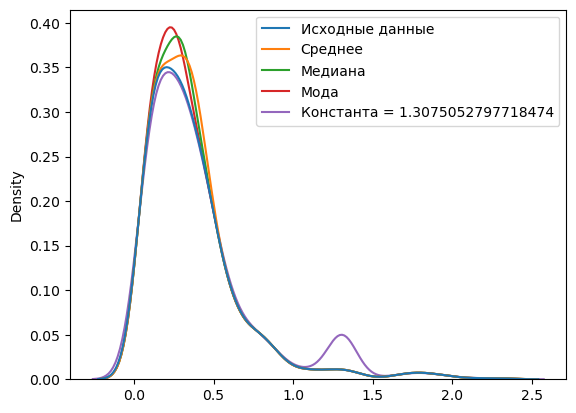

In [93]:
k_param = 3
bikeiqr = df_bike['speed'].mean() + k_param*df_bike['speed'].std()
bikeiqr

research_impute_numeric_column(df_bike, 'speed',bikeiqr)

## §3. Удаление константных и псевдоконстантых признаков 

In [94]:
print(df_bike['X'].max() - df_bike['X'].min())
print(df_bike['Y'].max() - df_bike['Y'].min())
df_bike = df_bike.dropna(axis=1, how='all')
df_bike.head()

0.0005450000000024602
0.00010600000000238197


,X,Y,track_fid,track_seg_id,track_seg_point_id,ele,time,speed,course,hAcc,vAcc
0,37.685089,55.765370,0,0,0,146.670151,2023/03/03 12:57:19+00,0.249437,103.951214,3.127947,1.486942
1,37.685092,55.765369,0,0,1,146.682946,2023/03/03 12:57:20+00,0.250490,104.202294,2.505558,1.338834
2,37.685095,55.765369,0,0,2,146.693712,2023/03/03 12:57:21+00,0.229481,104.679850,2.151725,1.187345
3,37.685099,55.765368,0,0,3,146.700226,2023/03/03 12:57:22+00,0.197788,104.288179,2.064231,1.071508
4,37.685102,55.765368,0,0,4,146.705792,2023/03/03 12:57:23+00,0.164360,101.709054,2.052416,0.985664


In [95]:
from sklearn.preprocessing import OrdinalEncoder
ord_enc = OrdinalEncoder()
df_bike["time"] = ord_enc.fit_transform(df_bike[["time"]])
df_bike.head()

,X,Y,track_fid,track_seg_id,track_seg_point_id,ele,time,speed,course,hAcc,vAcc
0,37.685089,55.765370,0,0,0,146.670151,0.0,0.249437,103.951214,3.127947,1.486942
1,37.685092,55.765369,0,0,1,146.682946,1.0,0.250490,104.202294,2.505558,1.338834
2,37.685095,55.765369,0,0,2,146.693712,2.0,0.229481,104.679850,2.151725,1.187345
3,37.685099,55.765368,0,0,3,146.700226,3.0,0.197788,104.288179,2.064231,1.071508
4,37.685102,55.765368,0,0,4,146.705792,4.0,0.164360,101.709054,2.052416,0.985664


In [96]:
from sklearn.feature_selection import VarianceThreshold
from sklearn.preprocessing import OrdinalEncoder
ord_enc = OrdinalEncoder()

var_tresh = VarianceThreshold(threshold=0)
var_tresh.fit(df_bike)
var_tresh.variances_

array([1.22733494e-08, 4.97191848e-10, 0.00000000e+00, 0.00000000e+00,
       1.09700000e+03, 2.09481995e+01, 1.08800000e+03, 9.80275596e-02,
       3.54440562e+02, 1.00281684e-01, 9.92613973e-03])

In [97]:
df_bike.shape

(1098, 11)

In [98]:
var_tresh.transform(df_bike).shape

(1098, 9)

In [99]:
df_bike.tail()

,X,Y,track_fid,track_seg_id,track_seg_point_id,ele,time,speed,course,hAcc,vAcc
1093,37.684871,55.765338,0,0,1093,151.253197,1084.0,0.409521,254.388281,2.059284,1.131151
1094,37.684865,55.765337,0,0,1094,150.856628,1085.0,0.369865,253.282432,2.067544,1.201025
1095,37.684860,55.765336,0,0,1095,150.463774,1086.0,0.317329,250.130033,2.144801,1.294121
1096,37.684856,55.765335,0,0,1096,150.075060,1087.0,0.276537,246.600584,2.455032,1.412464
1097,37.684852,55.765334,0,0,1097,149.689613,1088.0,0.257284,245.144496,3.243454,1.557121


## §4. График "Скрипичная диаграмма"

In [100]:


for region in df['region'].unique():
    print(region)
    region_df = df[df['region']==region]
    region_df = region_df[region_df['rank']<10]

    fig = px.violin(region_df,x='streams',color='rank',violinmode='overlay', title=f'Количество прослушиваний песен из топ-10 в {region}')
    fig.show()

Argentina


Australia


Brazil


Austria


Belgium


Colombia


Bolivia


Denmark


Bulgaria


Canada


Chile


Costa Rica


Czech Republic


Finland


Dominican Republic


Ecuador


El Salvador


Estonia


France


Germany


Global


Greece


Guatemala


Honduras


Hong Kong


Hungary


Iceland


Indonesia


Ireland


Italy


Japan


Latvia


Lithuania


Malaysia


Luxembourg


Mexico


Netherlands


New Zealand


Nicaragua


Norway


Panama


Paraguay


Peru


Philippines


Poland


Portugal


Singapore


Spain


Slovakia


Sweden


Taiwan


Switzerland


Turkey


United Kingdom


United States


Uruguay


Thailand


Andorra


Romania


Vietnam


Egypt


India


Israel


Morocco


Saudi Arabia


South Africa


United Arab Emirates


Russia


Ukraine


South Korea
